In [1]:
from pathlib import Path
import numpy as np
import pypolo

# Environment

We will download the image of 30-meter resolution elevation data from the [Shuttle Radar Topography Mission](https://www2.jpl.nasa.gov/srtm/) and use the elevation map as the ground-truth environment.
You can preview the image and choose your favorate tile from the link below.
Note down the tile ID, e.g., N17E073.
PyPolo provides utility function to download and preprocess the data.

https://dwtkns.com/srtm30m/

In [2]:
# Create a data folder
data_path = "./data/srtm"
Path(data_path).mkdir(exist_ok=True, parents=True)
# Download, preprocess, read the environment and print some statistics
env = pypolo.experiments.environments.get_environment("N17E073", data_path)

Successfully read data from data/srtm/preprocessed/N17E073.npy
Array 	shape:	(360, 360)
	min:	 1.89
	max:	 254.93
	dtype:	float64



We specify the environment extent and task extent. The robot can move within the environment extent but we only conduct the Robotic Information Gathering task in the task extent. We need to leave some buffer space because the robot is not guaranteed to always stay in the workspace due to [underactuation](https://en.wikipedia.org/wiki/Underactuation) or external disturbances. For example, an Autonomous Surface Vehicle (ASV) cannot turn in-place while moving at a high speed due to inertia and its motion can be disturbed by waves or strong wind.

In [3]:
# [xmin, xmax, ymin, ymax]
env_extent = [-11.0, 11.0, -11.0, 11.0]
task_extent = [-10.0, 10.0, -10.0, 10.0]

# Sensor

In [4]:
sensing_rate = 1.0
noise_scale = 1.0

In [5]:
sensor = pypolo.sensors.Ranger(
    rate=sensing_rate,  # collects 1 sonar measurement per sec
    env=env,  # the sensor samples from this environment
    env_extent=env_extent,  # workspace extent
    noise_scale=noise_scale,  # observational Gaussian noise scale (i.e., standard deviation)
)

# Pilot Survey

In [7]:
seed = 0
num_init_samples = 50
rng = pypolo.experiments.utilities.seed_everything(seed)

Set random seed to 0 in random, numpy, and torch.


In [8]:
bezier = pypolo.strategies.Bezier(task_extent=task_extent, rng=rng)
x_init = bezier.get(num_states=num_init_samples)
y_init = sensor.sense(states=x_init, rng=rng).reshape(-1, 1)

# Robot

In [10]:
control_rate = 10
max_lin_vel = 1.0
tolerance = 0.1

In [11]:
robot = pypolo.robots.USV(
        init_state=np.array([x_init[-1, 0], x_init[-1, 1], np.pi / 2]),
        control_rate=control_rate,
        max_lin_vel=max_lin_vel,
        tolerance=tolerance,
        sampling_rate=sensing_rate,
    )

# Model

In [14]:
init_amplitude = 1.0
init_lengthscale = 0.5
init_noise = 1.0

In [15]:
lr_hyper = 0.01
lr_nn = 0.001

In [13]:
kernel = pypolo.kernels.RBF(amplitude=init_amplitude, lengthscale=init_lengthscale)

In [16]:
model = pypolo.models.GPR(
    x_train=x_init,
    y_train=y_init,
    kernel=kernel,
    noise=init_noise,
    lr_hyper=lr_hyper,
    lr_nn=lr_nn,
)

In [17]:
model.optimize(num_iter=model.num_train, verbose=True)

Iter: 49 loss:  52.26: 100%|██████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 91.17it/s]


# Evaluator & Logger

In [18]:
eval_grid = [50, 50]

In [19]:
evaluator = pypolo.experiments.Evaluator(
        sensor=sensor,
        task_extent=task_extent,
        eval_grid=eval_grid,
    )

In [20]:
logger = pypolo.experiments.Logger(evaluator.eval_outputs)

# Evaluation

In [21]:
mean, std, error = evaluator.eval_prediction(model)

In [22]:
logger.append(mean, std, error, x_init, y_init, model.num_train)

# Strategy

In [23]:
num_candidates = 1000

In [24]:
strategy = pypolo.strategies.MyopicPlanning(
            task_extent=task_extent,
            rng=rng,
            num_candidates=num_candidates,
            robot=robot,
        )

# Experiment

In [26]:
max_num_samples = 700

In [25]:
def run(rng, model, strategy, sensor, evaluator, logger):
    while model.num_train < max_num_samples:
        x_new = strategy.get(model=model)
        y_new = sensor.sense(x_new, rng).reshape(-1, 1)
        model.add_data(x_new, y_new)
        model.optimize(num_iter=len(y_new), verbose=False)
        mean, std, error = evaluator.eval_prediction(model)
        logger.append(mean, std, error, x_new, y_new, model.num_train)
        pypolo.experiments.utilities.print_metrics(model, evaluator)

In [27]:
run(rng, model, strategy, sensor, evaluator, logger)

Data: 0051 | SMSE: 0.2428 | MSLL: -0.4029 | NLPD: 5.1856 | RMSE: 31.7133 | MAE : 25.1947
Data: 0053 | SMSE: 0.2429 | MSLL: -0.4091 | NLPD: 5.1771 | RMSE: 31.7219 | MAE : 25.1909
Data: 0054 | SMSE: 0.2429 | MSLL: -0.4121 | NLPD: 5.1732 | RMSE: 31.7206 | MAE : 25.1605
Data: 0068 | SMSE: 0.2456 | MSLL: -0.4659 | NLPD: 5.1224 | RMSE: 31.8953 | MAE : 25.2874
Data: 0086 | SMSE: 0.2413 | MSLL: -0.5372 | NLPD: 5.0506 | RMSE: 31.6138 | MAE : 24.4227
Data: 0089 | SMSE: 0.2404 | MSLL: -0.5504 | NLPD: 5.0388 | RMSE: 31.5602 | MAE : 24.2176
Data: 0090 | SMSE: 0.2403 | MSLL: -0.5548 | NLPD: 5.0351 | RMSE: 31.5531 | MAE : 24.1770
Data: 0093 | SMSE: 0.2403 | MSLL: -0.5683 | NLPD: 5.0245 | RMSE: 31.5521 | MAE : 24.1024
Data: 0095 | SMSE: 0.2406 | MSLL: -0.5774 | NLPD: 5.0178 | RMSE: 31.5679 | MAE : 24.1068
Data: 0097 | SMSE: 0.2409 | MSLL: -0.5869 | NLPD: 5.0112 | RMSE: 31.5877 | MAE : 24.1295
Data: 0099 | SMSE: 0.2412 | MSLL: -0.5965 | NLPD: 5.0047 | RMSE: 31.6071 | MAE : 24.1549
Data: 0101 | SMSE: 0.

Data: 0604 | SMSE: 0.0972 | MSLL: -1.1805 | NLPD: 4.4137 | RMSE: 20.0714 | MAE : 14.0007
Data: 0609 | SMSE: 0.0967 | MSLL: -1.1875 | NLPD: 4.4077 | RMSE: 20.0106 | MAE : 13.8760
Data: 0615 | SMSE: 0.0967 | MSLL: -1.1880 | NLPD: 4.4083 | RMSE: 20.0154 | MAE : 13.8992
Data: 0621 | SMSE: 0.0969 | MSLL: -1.1872 | NLPD: 4.4104 | RMSE: 20.0327 | MAE : 13.9398
Data: 0627 | SMSE: 0.0969 | MSLL: -1.1890 | NLPD: 4.4098 | RMSE: 20.0374 | MAE : 13.9407
Data: 0633 | SMSE: 0.0969 | MSLL: -1.1922 | NLPD: 4.4080 | RMSE: 20.0314 | MAE : 13.9232
Data: 0638 | SMSE: 0.0969 | MSLL: -1.1937 | NLPD: 4.4077 | RMSE: 20.0312 | MAE : 13.9220
Data: 0641 | SMSE: 0.0969 | MSLL: -1.1943 | NLPD: 4.4078 | RMSE: 20.0319 | MAE : 13.9230
Data: 0647 | SMSE: 0.0968 | MSLL: -1.1959 | NLPD: 4.4077 | RMSE: 20.0293 | MAE : 13.9166
Data: 0650 | SMSE: 0.0968 | MSLL: -1.1972 | NLPD: 4.4071 | RMSE: 20.0226 | MAE : 13.9080
Data: 0658 | SMSE: 0.0957 | MSLL: -1.2085 | NLPD: 4.3976 | RMSE: 19.9061 | MAE : 13.7500
Data: 0664 | SMSE: 0.

In [28]:
save_dir = "./outputs"
evaluator.save(save_dir)
logger.save(save_dir)

Saved metrics.csv to ./outputs
Saved log.npz to ./outputs


# Visualization

In [29]:
from pypolo.experiments import visualizer

In [30]:
log = np.load(f"{save_dir}/log.npz")

In [35]:
%matplotlib inline

In [38]:
!pip install pyvirtualdisplay

  Using cached PyVirtualDisplay-3.0-py3-none-any.whl (15 kB)


In [39]:
import pyvirtualdisplay

In [40]:
d = pyvirtualdisplay.Display()
d.start() # Start Xvfb and set "DISPLAY" environment properly.

In [42]:
from matplotlib import pyplot as plt

In [51]:
from IPython import display

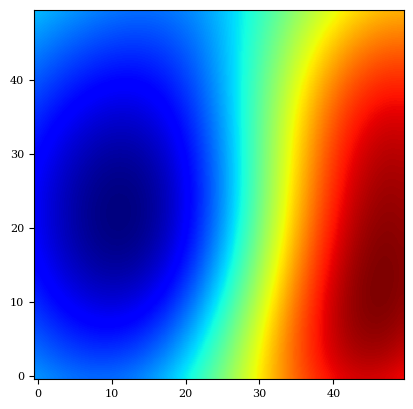

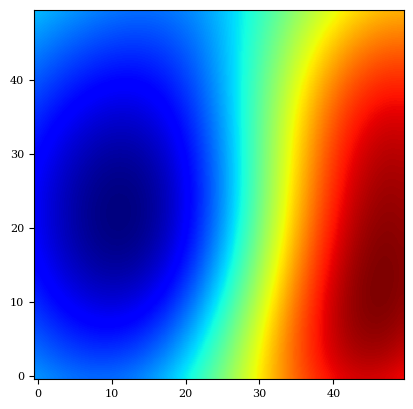

In [54]:
display.clear_output(wait=True)
fig, ax = plt.subplots()
ax.imshow(mean.reshape(eval_grid))
display.display(plt.gcf())

<IPython.core.display.Javascript object>


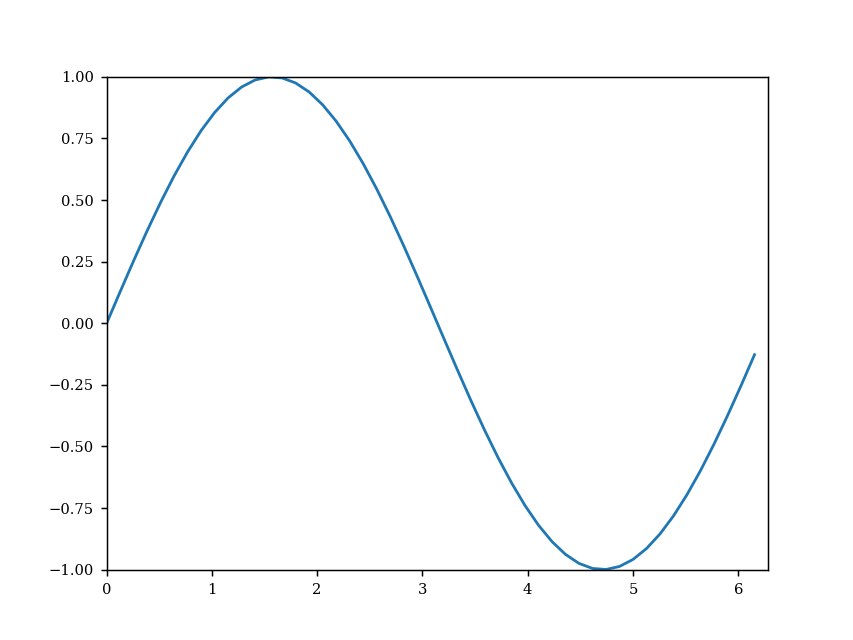

In [56]:
%matplotlib notebook
import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np

t = np.linspace(0,2*np.pi)
x = np.sin(t)

fig, ax = plt.subplots()
ax.axis([0,2*np.pi,-1,1])
l, = ax.plot([],[])

def animate(i):
    l.set_data(t[:i], x[:i])

ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(t))

from IPython.display import HTML
HTML(ani.to_jshtml())


<IPython.core.display.Javascript object>


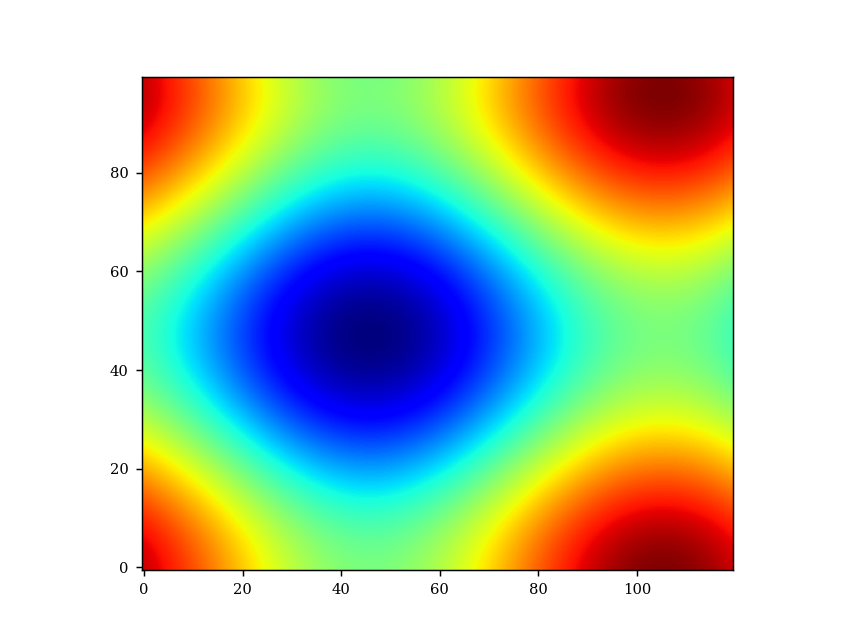

In [61]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

fig = plt.figure();


def f(x, y):
    return np.sin(x) + np.cos(y)

x = np.linspace(0, 2 * np.pi, 120)
y = np.linspace(0, 2 * np.pi, 100).reshape(-1, 1)

im = plt.imshow(f(x, y), animated=True);


def updatefig(*args):
    global x, y
    x += np.pi / 15.
    y += np.pi / 20.
    im.set_array(f(x, y))
    return im,

ani = animation.FuncAnimation(fig, updatefig, interval=50, blit=True);



In [58]:
HTML(ani.to_jshtml())